In [1]:
import sys
import os
sys.path.insert(0, os.path.join(os.getcwd(), '../core'))
import kaggle_support as kgs
import importlib
import matplotlib.pyplot as plt
import numpy as np
import cupy as cpZ
from dataclasses import dataclass, field, fields
import pack_cuda
import pack_vis
import pack_cost
import copy
import time
from IPython.display import HTML, display, clear_output
pack_cuda.USE_FLOAT32 = True
pack_cuda._ensure_initialized()


local
init CUDA
Detected GPU compute capability: 8.9 (arch=sm_89)
GPU max threads per block: 1024
=== Compiling kernel variant: crystal ===
Defines: ENABLE_CRYSTAL_AXES, ENABLE_OVERLAP_AREA, ENABLE_SEPARATION
Command: /usr/local/cuda/bin/nvcc -O3 -use_fast_math --extra-device-vectorization --ptxas-options=-v,--warn-on-spills -arch=sm_89 -DENABLE_CRYSTAL_AXES -DENABLE_OVERLAP_AREA -DENABLE_SEPARATION -cubin /mnt/d//packing/temp/pack_cuda_saved.cu -o /mnt/d//packing/temp/pack_cuda_crystal.cubin
ptxas info    : 0 bytes gmem, 1172 bytes cmem[3]
ptxas info    : Compiling entry function 'multi_boundary_distance_list_total' for 'sm_89'
ptxas info    : Function properties for multi_boundary_distance_list_total
    0 bytes stack frame, 0 bytes spill stores, 0 bytes spill loads
ptxas info    : Used 36 registers, 404 bytes cmem[0], 16 bytes cmem[2]
ptxas info    : Compiling entry function 'multi_boundary_list_total' for 'sm_89'
ptxas info    : Function properties for multi_boundary_list_total
   

In [2]:
%load_ext pyinstrument

In [6]:
#%%pyinstrument
#kgs.profiling=True
# %matplotlib widget
import pack_ga3
importlib.reload(pack_ga3)
import pack_runner
fastMode = False
kgs.debugging_mode = 2

def make_runner():
    runner = pack_ga3.baseline()
    runner.ga = runner.ga.ga_base
    runner.ga.N_trees_to_do = 40
    runner.n_generations = 30
    runner.ga.make_own_fig = (2,2)
    runner.ga.make_own_fig_size = (8,8)
    runner.ga.best_costs_per_generation_ax = ( (0,False,(0,0)) ,(1,True,(1,0)))
    runner.ga.plot_diversity_ax = (0,1)
    runner.ga.plot_population_fitness_ax = ( (1,True,(1,1)), )
    #runner.ga.plot_diversity_ax = (1,1)
    return runner
runner = make_runner()
runner.ga.alternative_selection = True
runner.ga.generate_extra = 0.1
runner.filter_before_rough = 0.1
#runner.ga.elitism_fraction = 0.5
runner.diagnostic_plot = True


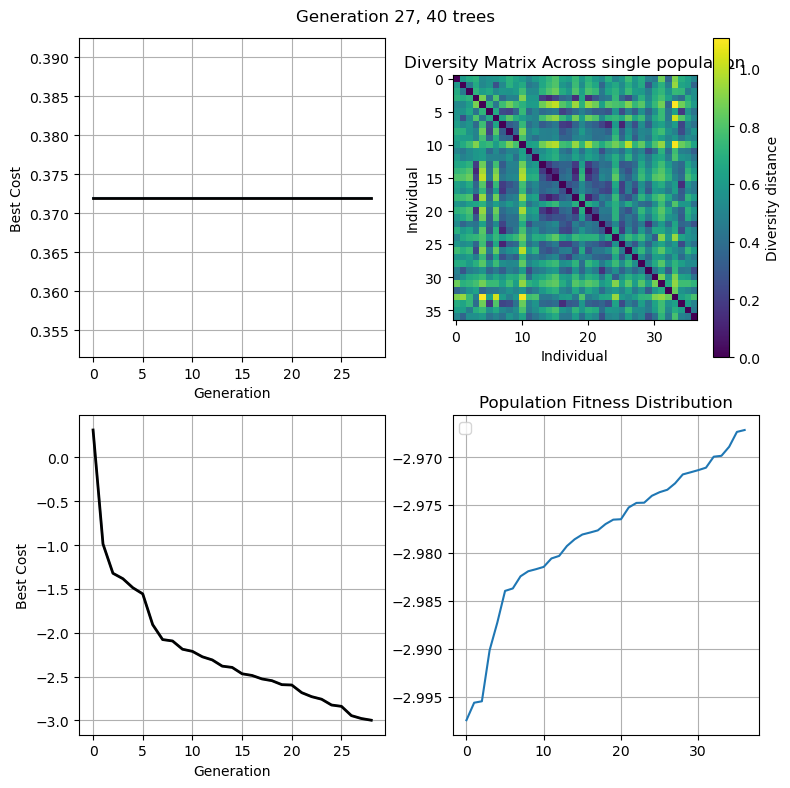

_     ._   __/__   _ _  _  _ _/_   Recorded: 12:16:55  Samples:  38947
 /_//_/// /_\ / //_// / //_'/ //     Duration: 52.459    CPU time: 51.147
/   _/                      v5.1.1

Cell [8]

47.874 <module>  /tmp/ipykernel_155640/2711015425.py:1
`- 47.874 Orchestrator.run  pack_ga3.py:1198
   |- 37.776 Orchestrator._relax  pack_ga3.py:1165
   |  `- 37.441 run_simulation_list  pack_dynamics.py:633
   |     `- 37.431 OptimizerBFGS.run_simulation  pack_dynamics.py:42
   |        `- 37.337 lbfgs  lbfgs_torch_parallel.py:382
   |           |- 18.937 [self]  lbfgs_torch_parallel.py
   |           |- 14.641 f_torch  pack_dynamics.py:68
   |           |  |- 10.029 Device.synchronize  <built-in>
   |           |  |- 3.427 CostCompound.compute_cost  pack_cost.py:50
   |           |  |  `- 3.308 CostCompound._compute_cost  pack_cost.py:91
   |           |  |     |- 1.856 AreaCost.compute_cost  pack_cost.py:50
   |           |  |     `- 1.443 [self]  pack_cost.py
   |           |  `- 0.914 [self]  pack_dynamics.py
   |           `- 0.790 Tensor.any  <built-in>
   |- 5.205 GASinglePopulationOld.apply_selection  pack_ga3.py:295
   |  `- 5.204 GASinglePopulationOld._apply_selection  pack_ga3.py:924
   |     `- 4.597 compute_genetic_diversity  kaggle_support.py:1074
   |        `- 4.575 compute_genetic_diversity_matrix  kaggle_support.py:942
   |           |- 3.099 [self]  kaggle_support.py
   |           `- 0.729 solve_lap_batch  lap_batch.py:259
   |              `- 0.649 Device.synchronize  <built-in>
   |- 3.641 GASinglePopulationOld.diagnostic_plots  pack_ga3.py:312
   |  |- 2.536 display  IPython/core/display_functions.py:85
   |  |     [29 frames hidden]  IPython, decorator, matplotlib
   |  `- 0.532 tight_layout  matplotlib/pyplot.py:2835
   |        [6 frames hidden]  matplotlib
   `- 0.711 GASinglePopulationOld.generate_offspring  pack_ga3.py:254
      `- 0.711 GASinglePopulationOld._generate_offspring  pack_ga3.py:1038
         `- 0.667 MoveSelector.do_move_vec  pack_move.py:42
            `- 0.667 MoveSelector._do_move_vec  pack_move.py:83
               `- 0.509 Crossover.do_move_vec  pack_move.py:42
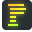

In [7]:
%%pyinstrument
kgs.profiling=True
runner.run()